In [1]:
import os

import ray
from cytoolz import valmap
from ray import ObjectRef
from tqdm import tqdm

from archpainter.experiments.tools.nrm_editor_views import show_image
from matplotlib import pyplot as plt
from archpainter.rulebook import auto, identify_image

#os.environ["RAY_PROFILING"] = "1"
from ray_jobs.ray_design import ray_design

from ray_jobs.remote_env import RemoteEnvManager
import torch

rem: RemoteEnvManager = ray_design.provide(RemoteEnvManager)
txt2img = rem["txt2img_env"]["txt2img"]
txt2img2 = rem["txt2img_env2"]["txt2img"]
z_decoder = txt2img2.model.decode_first_stage
#rem["txt2img_env"]


2022-09-02 15:13:59.405 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
2022-09-02 15:13:59.405 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
2022-09-02 15:13:59.406 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
2022-09-02 15:13:59.406 | DEBUG    | archpainter:<module>:14 - home directory:/Users/kento
2022-09-02 15:13:59.407 | INFO     | archpainter:get_storage_manager:78 - PID:40845	host:proboscis-mbp.local
2022-09-02 15:13:59.408 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['~/storage', '/Volumes/ExtremeSSD/storage']
2022-09-02 15:13:59.408 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/Users/kento/storage', '/Volumes/ExtremeSSD/storage']
2022-09-02 15:13:59.409 | INFO     | data_tree.storage_manager:__init

trying to register rp_serializer


In [2]:
txt2img2.env.status()

,key,type,refs
0,f7e27c4a-1798-4cf2-b099-7576ca9b85a6,<class 'type'>,1
1,8b301e57-1bb6-46b6-b256-fff2ccbab023,<class '__main__.Txt2Img'>,3
2,b993091a-d7cd-4856-a7b0-b8505b6b828e,<class '__main__.Txt2Img'>,2
3,08165634-0c7d-4b77-a783-6e6a88222552,<class 'str'>,1
4,2116a836-3372-4db0-9dc0-aca8b6fb250f,<class 'ldm.models.diffusion.ddpm.LatentDiffus...,1
5,9c84b174-4a4c-4681-9928-226f1d60704d,<class 'method'>,1


In [3]:
txt2img.env.status()

,key,type,refs
0,05c61d2d-31e6-4796-ab75-74d2d9ab3460,<class 'type'>,1
1,7274a4df-229c-409c-8d58-4fa5ac12013c,<class '__main__.Txt2Img'>,3
2,652681ef-dbe8-40d0-9481-59268970c0ab,<class '__main__.Txt2Img'>,2


In [4]:
def get_all_refs(x):
    match x:
        case dict():
            return valmap(get_all_refs,x)
        case list():
            return list(map(get_all_refs,tqdm(x)))
        case tuple():
            return list(map(get_all_refs,tqdm(x)))
        case ObjectRef():
            return get_all_refs(ray.get(x))
    return x

@ray.remote
def decode_z(z):
    decoded = z_decoder(z).cpu().fetch()
    decoded = torch.clamp((decoded + 1.0) / 2.0, min=0.0, max=1.0)
    decoded = auto("torch,float32,BCHW,RGB,0_1",decoded)
    return decoded

@ray.remote
def decode_item(item):
    img = item["img"].cpu().fetch()
    x0 = item["pred_x0"].cpu().fetch()
    img = auto("torch,float32,BCHW,RGBA,None",img)
    x0  = auto("torch,float32,BCHW,RGBA,None",x0)
    decoded = decode_z.remote(img.value)
    decoded_x0 = decode_z.remote(x0.value)
    return dict(
        i=item["i"],
        img =img,
        x0_hat=x0,
        decoded=decoded,
        decoded_x0_hat=decoded_x0
    )

@ray.remote
def plot_decoded(item):
    item = get_all_refs(item)
    i = item["i"]
    fig,axes = plt.subplots(ncols=2,nrows=2,figsize=(12,12))
    fig.suptitle(f"restoration process step={i}")
    axes[0,0].set_title("img")
    axes[0,0].imshow(item["img"].to("numpy_rgb"))
    axes[1,0].set_title("x0_hat")
    axes[1,0].imshow(item["x0_hat"].to("numpy_rgb"))
    axes[0,1].set_title("decoded")
    axes[0,1].imshow(item["decoded"].to("numpy_rgb"))
    axes[1,1].set_title("decoded_x0_hat")
    axes[1,1].imshow(item["decoded_x0_hat"].to("numpy_rgb"))
    plt.tight_layout()
    return plt.gcf()


In [5]:
history = []
for item in tqdm(txt2img.prompt_to_generator("A beautiful illustration of eggplants, by Mucha")):
    decoded = decode_item.remote(item)
    history.append(decoded)

3it [00:03,  1.06it/s](get_class_info pid=107126) 2022-09-02 06:14:17.650 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(get_class_info pid=107126) 2022-09-02 06:14:17.650 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(get_class_info pid=107126) 2022-09-02 06:14:17.650 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(get_class_info pid=107126) 2022-09-02 06:14:17.651 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(get_class_info pid=107126) 2022-09-02 06:14:17.652 | INFO     | archpainter:get_storage_manager:78 - PID:107126	host:zeus
(get_class_info pid=107126) 2022-09-02 06:14:17.653 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(get_class_info pid=107126) 2022-09-02 06:14:17.654 |

(get_class_info pid=107126) trying to register rp_serializer


6it [00:04,  1.84it/s](pid=107219) 2022-09-02 06:14:18.892 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107219) 2022-09-02 06:14:18.892 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107219) 2022-09-02 06:14:18.892 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107219) 2022-09-02 06:14:18.893 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=107219) 2022-09-02 06:14:18.894 | INFO     | archpainter:get_storage_manager:78 - PID:107219	host:zeus
(pid=107219) 2022-09-02 06:14:18.895 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=107219) 2022-09-02 06:14:18.895 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/ho

(pid=107219) trying to register rp_serializer


(pid=107257) 2022-09-02 06:14:19.717 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107257) 2022-09-02 06:14:19.717 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107257) 2022-09-02 06:14:19.717 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107257) 2022-09-02 06:14:19.718 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=107257) 2022-09-02 06:14:19.719 | INFO     | archpainter:get_storage_manager:78 - PID:107257	host:zeus
(pid=107257) 2022-09-02 06:14:19.720 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=107257) 2022-09-02 06:14:19.720 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/home/kento/storage2']
(p

(pid=107225) trying to register rp_serializer


(pid=107289) 2022-09-02 06:14:20.141 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107289) 2022-09-02 06:14:20.141 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107289) 2022-09-02 06:14:20.141 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107289) 2022-09-02 06:14:20.142 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=107289) 2022-09-02 06:14:20.143 | INFO     | archpainter:get_storage_manager:78 - PID:107289	host:zeus
(pid=107289) 2022-09-02 06:14:20.145 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=107289) 2022-09-02 06:14:20.145 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/home/kento/storage2']
(p

(pid=107257) trying to register rp_serializer
(pid=107356) trying to register rp_serializer
(pid=107357) trying to register rp_serializer


(pid=107257) 2022-09-02 06:14:20.331 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107356) 2022-09-02 06:14:20.403 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107357) 2022-09-02 06:14:20.375 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107324) 2022-09-02 06:14:20.572 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107324) 2022-09-02 06:14:20.572 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107324) 2022-09-02 06:14:20.572 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107324) 2022-09-02 06:14:20.573 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=1073

(pid=107289) trying to register rp_serializer


12it [00:07,  2.34it/s](pid=107356) 2022-09-02 06:14:21.101 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107356) 2022-09-02 06:14:21.101 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107356) 2022-09-02 06:14:21.101 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107356) 2022-09-02 06:14:21.102 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=107356) 2022-09-02 06:14:21.103 | INFO     | archpainter:get_storage_manager:78 - PID:107356	host:zeus
(pid=107356) 2022-09-02 06:14:21.105 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=107356) 2022-09-02 06:14:21.105 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/h

(pid=107324) trying to register rp_serializer
(pid=107486) trying to register rp_serializer
(pid=107481) trying to register rp_serializer
(pid=107482) trying to register rp_serializer
(pid=107487) trying to register rp_serializer


13it [00:07,  2.37it/s](decode_item pid=107289) 2022-09-02 06:14:21.501 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=107289) 2022-09-02 06:14:21.502 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(pid=107483) 2022-09-02 06:14:21.526 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107507) 2022-09-02 06:14:21.635 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107505) 2022-09-02 06:14:21.664 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!


(pid=107483) trying to register rp_serializer
(pid=107505) trying to register rp_serializer
(pid=107507) trying to register rp_serializer


(pid=107358) 2022-09-02 06:14:21.768 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107506) 2022-09-02 06:14:21.685 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
14it [00:08,  2.38it/s](decode_item pid=107324) 2022-09-02 06:14:21.917 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=107324) 2022-09-02 06:14:21.917 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(decode_item pid=107358) 2022-09-02 06:14:21.929 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=107358) 2022-09-02 06:14:21.929 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(pid=107482) 2022-09-02 06:14:21.940 | WARNING  | pinject_design.di.util:patch_pinject_single

(pid=107358) trying to register rp_serializer
(pid=107506) trying to register rp_serializer


(pid=107487) 2022-09-02 06:14:21.993 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107487) 2022-09-02 06:14:21.994 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107487) 2022-09-02 06:14:21.994 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107487) 2022-09-02 06:14:21.994 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=107487) 2022-09-02 06:14:21.995 | INFO     | archpainter:get_storage_manager:78 - PID:107487	host:zeus
(pid=107487) 2022-09-02 06:14:21.997 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=107487) 2022-09-02 06:14:21.998 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/home/kento/storage2']
(p

(pid=107508) trying to register rp_serializer
(pid=107802) trying to register rp_serializer
(pid=107810) trying to register rp_serializer
(pid=107808) trying to register rp_serializer


(pid=107805) 2022-09-02 06:14:23.222 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107855) 2022-09-02 06:14:23.343 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107856) 2022-09-02 06:14:23.457 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107866) 2022-09-02 06:14:23.432 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=107851) 2022-09-02 06:14:23.449 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!


(pid=107805) trying to register rp_serializer
(pid=107855) trying to register rp_serializer
(pid=107866) trying to register rp_serializer
(pid=107851) trying to register rp_serializer
(pid=107856) trying to register rp_serializer


18it [00:09,  2.40it/s](pid=107802) 2022-09-02 06:14:23.805 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107802) 2022-09-02 06:14:23.805 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107802) 2022-09-02 06:14:23.806 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107802) 2022-09-02 06:14:23.807 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=107802) 2022-09-02 06:14:23.808 | INFO     | archpainter:get_storage_manager:78 - PID:107802	host:zeus
(pid=107802) 2022-09-02 06:14:23.810 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=107802) 2022-09-02 06:14:23.810 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/h

(pid=107995) trying to register rp_serializer
(pid=108120) trying to register rp_serializer
(pid=108123) trying to register rp_serializer


20it [00:10,  2.41it/s](pid=107809) 2022-09-02 06:14:24.573 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=108179) 2022-09-02 06:14:24.617 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(pid=108181) 2022-09-02 06:14:24.696 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!


(pid=107809) trying to register rp_serializer
(pid=108179) trying to register rp_serializer
(pid=108181) trying to register rp_serializer


21it [00:11,  2.41it/s](decode_item pid=107809) 2022-09-02 06:14:24.818 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=107809) 2022-09-02 06:14:24.818 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(pid=107995) 2022-09-02 06:14:24.786 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=107995) 2022-09-02 06:14:24.786 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=107995) 2022-09-02 06:14:24.786 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=107995) 2022-09-02 06:14:24.787 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=107995) 2022-09-02 06:14:24.788 | INFO     | archpainter:get_storage_manager:78 - P

(pid=108176) trying to register rp_serializer


(pid=108270) 2022-09-02 06:14:25.078 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
22it [00:11,  2.42it/s]

(pid=108270) trying to register rp_serializer


(pid=108179) 2022-09-02 06:14:25.386 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=108179) 2022-09-02 06:14:25.386 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=108179) 2022-09-02 06:14:25.386 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=108179) 2022-09-02 06:14:25.387 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=108179) 2022-09-02 06:14:25.389 | INFO     | archpainter:get_storage_manager:78 - PID:108179	host:zeus
(pid=108179) 2022-09-02 06:14:25.391 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=108179) 2022-09-02 06:14:25.391 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/home/kento/storage2']
(p

(pid=108271) trying to register rp_serializer
(pid=108358) trying to register rp_serializer
(pid=108359) trying to register rp_serializer


(pid=108270) 2022-09-02 06:14:25.786 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=108270) 2022-09-02 06:14:25.786 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=108270) 2022-09-02 06:14:25.786 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=108270) 2022-09-02 06:14:25.787 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=108270) 2022-09-02 06:14:25.788 | INFO     | archpainter:get_storage_manager:78 - PID:108270	host:zeus
(pid=108270) 2022-09-02 06:14:25.789 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=108270) 2022-09-02 06:14:25.790 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/home/kento/storage2']
(p

(pid=108453) trying to register rp_serializer


24it [00:12,  2.42it/s](pid=108271) 2022-09-02 06:14:26.142 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=108271) 2022-09-02 06:14:26.143 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=108271) 2022-09-02 06:14:26.143 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(pid=108271) 2022-09-02 06:14:26.144 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(pid=108271) 2022-09-02 06:14:26.146 | INFO     | archpainter:get_storage_manager:78 - PID:108271	host:zeus
(pid=108271) 2022-09-02 06:14:26.149 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/internal_tank/storage', '~/storage2']
(pid=108271) 2022-09-02 06:14:26.149 | DEBUG    | data_tree.storage_manager:__init__:49 - expanded scan targets:['/internal_tank/storage', '/h

(pid=108455) trying to register rp_serializer
(pid=108539) trying to register rp_serializer


28it [00:13,  2.42it/s](decode_item pid=108455) 2022-09-02 06:14:27.720 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=108455) 2022-09-02 06:14:27.720 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
29it [00:14,  2.42it/s](decode_item pid=108539) 2022-09-02 06:14:28.118 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=108539) 2022-09-02 06:14:28.118 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(pid=108702) 2022-09-02 06:14:28.254 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=108702) 2022-09-02 06:14:28.254 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=108702) 2022-09-02 06:14:28.254 | WARNING  

(pid=108702) trying to register rp_serializer
(pid=108720) trying to register rp_serializer


(pid=108705) 2022-09-02 06:14:29.246 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
32it [00:15,  2.41it/s]

(pid=108705) trying to register rp_serializer


33it [00:16,  2.40it/s](decode_item pid=108720) 2022-09-02 06:14:29.774 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=108720) 2022-09-02 06:14:29.774 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(decode_item pid=108705) 2022-09-02 06:14:29.771 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_item pid=108705) 2022-09-02 06:14:29.772 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(pid=108847) 2022-09-02 06:14:29.856 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(pid=108847) 2022-09-02 06:14:29.856 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(pid=108847) 2022-09-02 06:14:29.856 | WARNING  | pinject_design.di.uti

(pid=108847) trying to register rp_serializer


43it [00:20,  2.42it/s](decode_z pid=107356) 2022-09-02 06:14:33.938 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_z pid=107356) 2022-09-02 06:14:33.939 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(decode_z pid=107357) 2022-09-02 06:14:33.923 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_z pid=107357) 2022-09-02 06:14:33.924 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
44it [00:20,  2.41it/s](decode_z pid=107481) 2022-09-02 06:14:34.613 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
(decode_z pid=107481) 2022-09-02 06:14:34.613 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /home/kento/.cache/omni_converter.shelve3_10_5
(decode_z pid=107482) 2022-09-02 06:14:34.593 | INFO  

In [6]:
from IPython.display import display
from ipywidgets import interact
@interact(i=(0,len(history)-1))
def show_h(i):
    item = ray.get(history[i])
    display(item["img"])
    display(item["x0_hat"])
    plt.hist(item["x0_hat"].value.numpy().flatten(),bins=128)
    display(plt.show())
    display(ray.get(item["decoded"]))
    display(ray.get(item["decoded_x0_hat"]))

interactive(children=(IntSlider(value=24, description='i', max=49), Output()), _dom_classes=('widget-interact'…

In [7]:
from data_tree import series

In [12]:
z = ray.get(history[-1])['img'].value

2022-08-28 20:28:29.037 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
2022-08-28 20:28:29.038 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /Users/kento/.cache/omni_converter.shelve3_10_5


In [13]:
rz = txt2img2.env.put(z).to(txt2img2.device)

In [14]:
rz1 = txt2img2.model.first_stage_model.post_quant_conv(rz)
# so it is AutoencoderKL.
# how is this trained? how is this strong?
# this model seems very strong, strong enough to create a beautiful image.
# so lets Encode some example image and bring it back to see how it is going to generate things.
# if that works pretty well, you can use any network to work in that space!

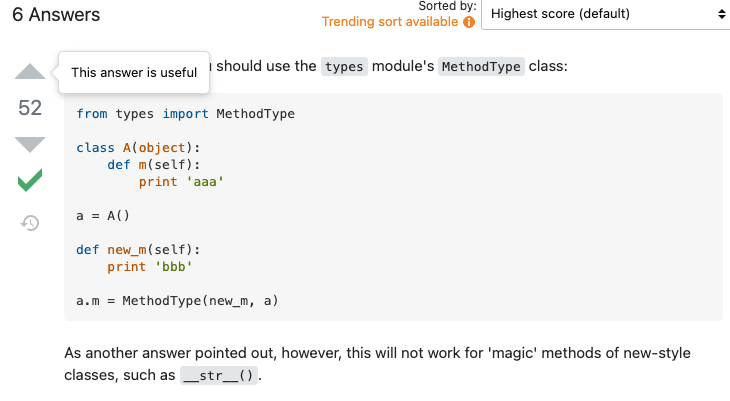

In [15]:
txt2img2.env.status()

,key,type,refs
0,8d13c2c6-c6e8-47dc-b873-31c96aedcb8e,<class 'type'>,1
1,1caec740-b2ca-41ed-bf3b-af9086827870,<class '__main__.Txt2Img'>,3
2,e8972189-5d3e-459c-ad65-0a4fe8d8548a,<class '__main__.Txt2Img'>,2
3,5e44344e-356a-4fc9-a593-8a8b7a15b2a5,<class 'str'>,1
4,9483a6db-4451-40d2-b60b-54f4f659817c,<class 'ldm.models.diffusion.ddpm.LatentDiffus...,1
...,...,...,...
309,2748b8a9-aeed-4fe7-9ada-9705052c743d,<class 'torch.Tensor'>,3
310,52899c44-7673-4903-8518-079f04738a1a,<class 'ldm.models.diffusion.ddpm.LatentDiffus...,1
311,b56c8f14-2bdb-49ef-a834-5cf1bfc20bdd,<class 'ldm.models.autoencoder.AutoencoderKL'>,1
312,a74c7435-8a34-475b-bd4c-22e6f343c122,<class 'torch.nn.modules.conv.Conv2d'>,1


In [16]:
# I want to see whats happening in here
# what can I do with it?
# => bring the tgt var on loca, and then call on self.
from ldm.models.autoencoder import VQModelInterface
@torch.no_grad()
def decode_first_stage(self, z, predict_cids=False, force_not_quantize=False):
    z = z.to(self.device)
    if predict_cids:
        if z.dim() == 4:
            z = torch.argmax(z.exp(), dim=1).long()
        z = self.first_stage_model.quantize.get_codebook_entry(z, shape=None)
        z = rearrange(z, 'b h w c -> b c h w').contiguous()

    z = 1. / self.scale_factor * z
    
    print(f"z is now:{z.shape}")

    if hasattr(self, "split_input_params"):
        if self.split_input_params["patch_distributed_vq"]:
            ks = self.split_input_params["ks"]  # eg. (128, 128)
            stride = self.split_input_params["stride"]  # eg. (64, 64)
            uf = self.split_input_params["vqf"]
            bs, nc, h, w = z.shape
            if ks[0] > h or ks[1] > w:
                ks = (min(ks[0], h), min(ks[1], w))
                print("reducing Kernel")

            if stride[0] > h or stride[1] > w:
                stride = (min(stride[0], h), min(stride[1], w))
                print("reducing stride")

            fold, unfold, normalization, weighting = self.get_fold_unfold(z, ks, stride, uf=uf)

            z = unfold(z)  # (bn, nc * prod(**ks), L)
            # 1. Reshape to img shape
            print("reshaping")
            z = z.view((z.shape[0], -1, ks[0], ks[1], z.shape[-1]))  # (bn, nc, ks[0], ks[1], L )
            print(f"z shape:{z.shape}")

            # 2. apply model loop over last dim
            if isinstance(self.first_stage_model, VQModelInterface):
                print(f"calling first_stage_model.decode")
                output_list = [self.first_stage_model.decode(z[:, :, :, :, i],
                                                             force_not_quantize=predict_cids or force_not_quantize)
                               for i in range(z.shape[-1])]
                print(f"first_stage_model.decode is done")
            else:

                output_list = [self.first_stage_model.decode(z[:, :, :, :, i])
                               for i in range(z.shape[-1])]

            o = torch.stack(output_list, axis=-1)  # # (bn, nc, ks[0], ks[1], L)
            o = o * weighting
            # Reverse 1. reshape to img shape
            o = o.view((o.shape[0], -1, o.shape[-1]))  # (bn, nc * ks[0] * ks[1], L)
            # stitch crops together
            decoded = fold(o)
            decoded = decoded / normalization  # norm is shape (1, 1, h, w)
            return decoded
        else:
            if isinstance(self.first_stage_model, VQModelInterface):
                return self.first_stage_model.decode(z, force_not_quantize=predict_cids or force_not_quantize)
            else:
                return self.first_stage_model.decode(z)

    else:
        print("am I in this branch?")
        if isinstance(self.first_stage_model, VQModelInterface):
            print("this one?")
            return self.first_stage_model.decode(z, force_not_quantize=predict_cids or force_not_quantize)
        else:
            print("we are in this branch actually")
            return self.first_stage_model.decode(z)

In [17]:
decoded = decode_first_stage(txt2img2.model,rz)


z is now:Var@zeus:(torch.Size([3, 4, 64, 64]))
am I in this branch?
we are in this branch actually


2022-08-28 20:28:38.659 | INFO     | omni_converter.solver.astar:__post_init__:175 - created a solver
2022-08-28 20:28:38.661 | DEBUG    | omni_converter.solver.astar:__post_init__:235 - using solver cache at /Users/kento/.cache/omni_converter.shelve3_10_5


RuledData(data=AutoData2(value=tensor([[[[ 0.9150,  0.9293,  0.9248,  ...,  0.8086,  0.8209,  0.8468],
          [ 0.9384,  0.9164,  0.9193,  ...,  0.8118,  0.8438,  0.8361],
          [ 0.9271,  0.9147,  0.9148,  ...,  0.8264,  0.8286,  0.8508],
          ...,
          [ 0.9459,  0.9304,  0.9436,  ...,  0.7815,  0.8275,  0.8317],
          [ 0.9288,  0.9278,  0.9420,  ...,  0.7876,  0.7778,  0.8146],
          [ 0.9415,  0.9618,  0.9560,  ...,  0.8396,  0.8551,  0.7929]],

         [[ 0.7376,  0.7910,  0.7725,  ...,  0.7151,  0.7339,  0.7371],
          [ 0.7703,  0.7773,  0.8043,  ...,  0.7234,  0.7150,  0.7240],
          [ 0.7741,  0.7820,  0.8149,  ...,  0.7483,  0.7116,  0.7586],
          ...,
          [ 0.7772,  0.7820,  0.8022,  ...,  0.6597,  0.6413,  0.6588],
          [ 0.8150,  0.7802,  0.8046,  ...,  0.6490,  0.6071,  0.6254],
          [ 0.7781,  0.8317,  0.8314,  ...,  0.7369,  0.7356,  0.6525]],

         [[ 0.5534,  0.6134,  0.6341,  ...,  0.4239,  0.4263,  0.4425],
          [ 0.5674,  0.5982,  0.6034,  ...,  0.3872,  0.3676,  0.3903],
          [ 0.5940,  0.6046,  0.5861,  ...,  0.4166,  0.3741,  0.4316],
          ...,
          [ 0.5297,  0.5656,  0.5466,  ...,  0.3335,  0.3792,  0.4055],
          [ 0.5571,  0.5549,  0.5643,  ...,  0.3374,  0.3239,  0.3933],
          [ 0.5600,  0.6118,  0.5813,  ...,  0.4355,  0.4293,  0.3947]]],


        [[[ 0.7293,  0.7794,  0.7605,  ..., -0.5500, -0.6409, -0.2294],
          [ 0.6025,  0.8326,  0.7793,  ..., -1.0117, -0.5204,  0.1574],
          [ 0.5879,  0.5923,  0.5535,  ..., -1.0512, -0.6314, -0.0207],
          ...,
          [ 0.8449,  0.8662,  0.9419,  ..., -0.9281,  0.2860,  0.6932],
          [ 0.8698,  0.8344,  0.9274,  ..., -0.8519, -0.0870,  0.7233],
          [ 0.8274,  0.7692,  0.9013,  ..., -0.9289, -0.4881,  0.5593]],

         [[ 0.6115,  0.7279,  0.6743,  ..., -0.3614, -0.6100, -0.3853],
          [ 0.5240,  0.6939,  0.5912,  ..., -1.0341, -0.4207,  0.1285],
          [ 0.5515,  0.4283,  0.3992,  ..., -1.0720, -0.5597,  0.0453],
          ...,
          [ 0.7824,  0.8677,  0.9494,  ..., -0.9726,  0.3863,  0.6345],
          [ 0.8469,  0.7559,  0.9300,  ..., -0.9298, -0.0746,  0.7349],
          [ 0.8251,  0.7623,  0.9089,  ..., -0.8933, -0.6941,  0.3797]],

         [[ 0.2048,  0.2540,  0.2387,  ..., -0.4341, -0.6490, -0.5121],
          [ 0.1707,  0.1599,  0.0134,  ..., -0.8674, -0.4913,  0.1567],
          [ 0.2072, -0.0421, -0.2191,  ..., -0.9854, -0.6392, -0.1430],
          ...,
          [-0.0281,  0.2804,  0.3394,  ..., -0.9525, -0.1018,  0.2713],
          [ 0.2813,  0.3308,  0.4186,  ..., -0.9317, -0.4473,  0.2651],
          [ 0.3326,  0.4057,  0.4192,  ..., -0.9654, -0.8589, -0.0969]]],


        [[[-0.3600, -0.5823,  0.4845,  ..., -0.1197, -0.5638, -0.2710],
          [-0.4598, -0.6549,  0.6332,  ..., -0.1156, -0.5448, -0.4706],
          [-0.5111, -0.6882,  0.5729,  ..., -0.1177, -0.6209, -0.6516],
          ...,
          [-0.6190, -0.5923, -0.6220,  ..., -0.6221, -0.4974, -0.7499],
          [-0.5781, -0.5336, -0.5602,  ..., -0.5929, -0.5651, -0.6841],
          [-0.6359, -0.5634, -0.5924,  ..., -0.6578, -0.6747, -0.6119]],

         [[-0.5315, -0.7160,  0.4213,  ..., -0.2388, -0.7559, -0.4627],
          [-0.6013, -0.7305,  0.6127,  ..., -0.2794, -0.7233, -0.6899],
          [-0.6105, -0.7535,  0.5209,  ..., -0.2799, -0.7189, -0.7808],
          ...,
          [-0.7785, -0.7880, -0.7993,  ..., -0.7961, -0.6188, -0.9072],
          [-0.7857, -0.7753, -0.7900,  ..., -0.8130, -0.6789, -0.7897],
          [-0.8250, -0.7867, -0.7900,  ..., -0.8108, -0.8206, -0.7792]],

         [[-0.7122, -0.8722,  0.2488,  ..., -0.3648, -0.7895, -0.5736],
          [-0.7319, -0.8741,  0.2954,  ..., -0.4422, -0.8172, -0.7229],
          [-0.6702, -0.8067,  0.2824,  ..., -0.3777, -0.7383, -0.7597],
          ...,
          [-0.8953, -0.8492, -0.8832,  ..., -0.8261, -0.7375, -0.9311],
          [-0.8728, -0.8350, -0.8428,  ..., -0.8154, -0.7455, -0.8639]
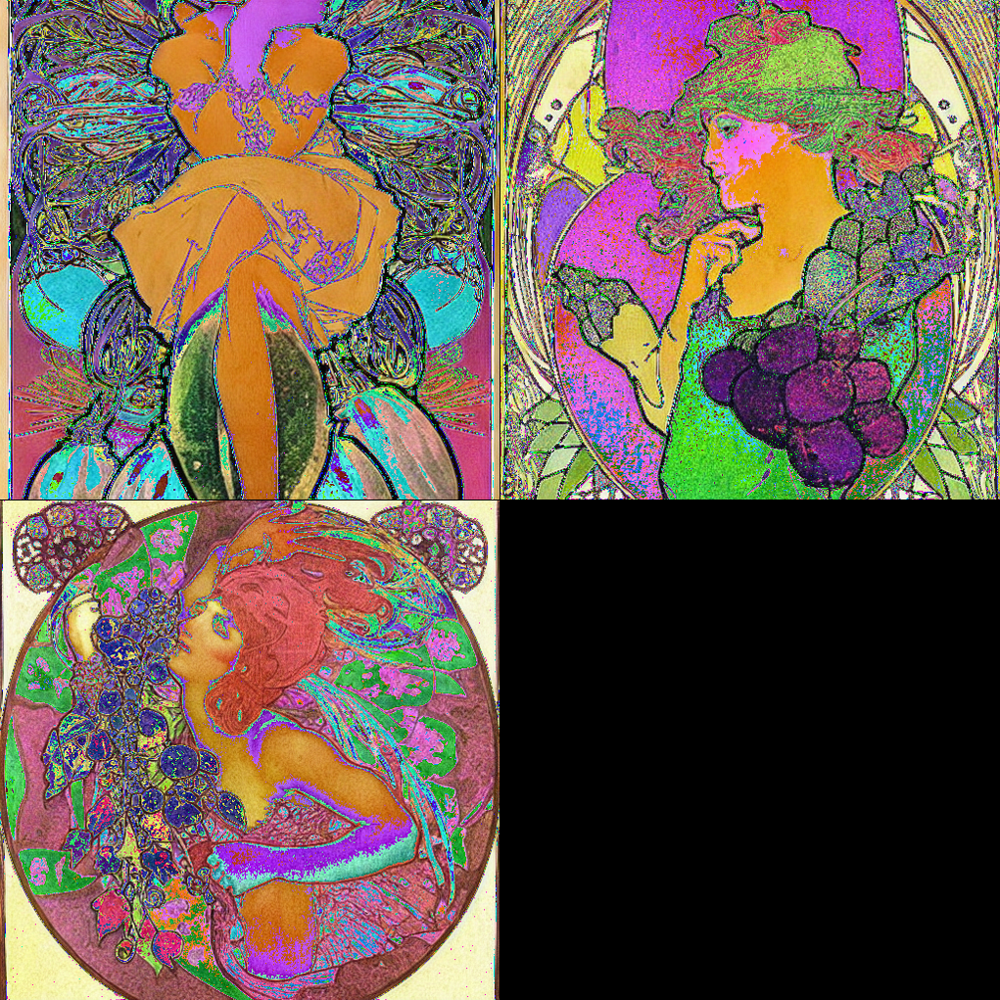

In [18]:
rescaled_z = 1 / txt2img2.model.scale_factor * rz
x = txt2img2.model.first_stage_model.decode(rescaled_z)
auto("torch,flaot32,BCHW,RGB,0_1",x.cpu().fetch())

In [19]:
encoder = txt2img2.model.first_stage_model.encoder
decoder = txt2img2.model.first_stage_model.decoder

RuledData(data=AutoData2(value=tensor([[[[ 0.9150,  0.9293,  0.9248,  ...,  0.8086,  0.8209,  0.8468],
          [ 0.9384,  0.9164,  0.9193,  ...,  0.8118,  0.8438,  0.8361],
          [ 0.9271,  0.9147,  0.9148,  ...,  0.8264,  0.8286,  0.8508],
          ...,
          [ 0.9459,  0.9304,  0.9436,  ...,  0.7815,  0.8275,  0.8317],
          [ 0.9288,  0.9278,  0.9420,  ...,  0.7876,  0.7778,  0.8146],
          [ 0.9415,  0.9618,  0.9560,  ...,  0.8396,  0.8551,  0.7929]],

         [[ 0.7376,  0.7910,  0.7725,  ...,  0.7151,  0.7339,  0.7371],
          [ 0.7703,  0.7773,  0.8043,  ...,  0.7234,  0.7150,  0.7240],
          [ 0.7741,  0.7820,  0.8149,  ...,  0.7483,  0.7116,  0.7586],
          ...,
          [ 0.7772,  0.7820,  0.8022,  ...,  0.6597,  0.6413,  0.6588],
          [ 0.8150,  0.7802,  0.8046,  ...,  0.6490,  0.6071,  0.6254],
          [ 0.7781,  0.8317,  0.8314,  ...,  0.7369,  0.7356,  0.6525]],

         [[ 0.5534,  0.6134,  0.6341,  ...,  0.4239,  0.4263,  0.4425],
          [ 0.5674,  0.5982,  0.6034,  ...,  0.3872,  0.3676,  0.3903],
          [ 0.5940,  0.6046,  0.5861,  ...,  0.4166,  0.3741,  0.4316],
          ...,
          [ 0.5297,  0.5656,  0.5466,  ...,  0.3335,  0.3792,  0.4055],
          [ 0.5571,  0.5549,  0.5643,  ...,  0.3374,  0.3239,  0.3933],
          [ 0.5600,  0.6118,  0.5813,  ...,  0.4355,  0.4293,  0.3947]]],


        [[[ 0.7293,  0.7794,  0.7605,  ..., -0.5500, -0.6409, -0.2294],
          [ 0.6025,  0.8326,  0.7793,  ..., -1.0117, -0.5204,  0.1574],
          [ 0.5879,  0.5923,  0.5535,  ..., -1.0512, -0.6314, -0.0207],
          ...,
          [ 0.8449,  0.8662,  0.9419,  ..., -0.9281,  0.2860,  0.6932],
          [ 0.8698,  0.8344,  0.9274,  ..., -0.8519, -0.0870,  0.7233],
          [ 0.8274,  0.7692,  0.9013,  ..., -0.9289, -0.4881,  0.5593]],

         [[ 0.6115,  0.7279,  0.6743,  ..., -0.3614, -0.6100, -0.3853],
          [ 0.5240,  0.6939,  0.5912,  ..., -1.0341, -0.4207,  0.1285],
          [ 0.5515,  0.4283,  0.3992,  ..., -1.0720, -0.5597,  0.0453],
          ...,
          [ 0.7824,  0.8677,  0.9494,  ..., -0.9726,  0.3863,  0.6345],
          [ 0.8469,  0.7559,  0.9300,  ..., -0.9298, -0.0746,  0.7349],
          [ 0.8251,  0.7623,  0.9089,  ..., -0.8933, -0.6941,  0.3797]],

         [[ 0.2048,  0.2540,  0.2387,  ..., -0.4341, -0.6490, -0.5121],
          [ 0.1707,  0.1599,  0.0134,  ..., -0.8674, -0.4913,  0.1567],
          [ 0.2072, -0.0421, -0.2191,  ..., -0.9854, -0.6392, -0.1430],
          ...,
          [-0.0281,  0.2804,  0.3394,  ..., -0.9525, -0.1018,  0.2713],
          [ 0.2813,  0.3308,  0.4186,  ..., -0.9317, -0.4473,  0.2651],
          [ 0.3326,  0.4057,  0.4192,  ..., -0.9654, -0.8589, -0.0969]]],


        [[[-0.3600, -0.5823,  0.4845,  ..., -0.1197, -0.5638, -0.2710],
          [-0.4598, -0.6549,  0.6332,  ..., -0.1156, -0.5448, -0.4706],
          [-0.5111, -0.6882,  0.5729,  ..., -0.1177, -0.6209, -0.6516],
          ...,
          [-0.6190, -0.5923, -0.6220,  ..., -0.6221, -0.4974, -0.7499],
          [-0.5781, -0.5336, -0.5602,  ..., -0.5929, -0.5651, -0.6841],
          [-0.6359, -0.5634, -0.5924,  ..., -0.6578, -0.6747, -0.6119]],

         [[-0.5315, -0.7160,  0.4213,  ..., -0.2388, -0.7559, -0.4627],
          [-0.6013, -0.7305,  0.6127,  ..., -0.2794, -0.7233, -0.6899],
          [-0.6105, -0.7535,  0.5209,  ..., -0.2799, -0.7189, -0.7808],
          ...,
          [-0.7785, -0.7880, -0.7993,  ..., -0.7961, -0.6188, -0.9072],
          [-0.7857, -0.7753, -0.7900,  ..., -0.8130, -0.6789, -0.7897],
          [-0.8250, -0.7867, -0.7900,  ..., -0.8108, -0.8206, -0.7792]],

         [[-0.7122, -0.8722,  0.2488,  ..., -0.3648, -0.7895, -0.5736],
          [-0.7319, -0.8741,  0.2954,  ..., -0.4422, -0.8172, -0.7229],
          [-0.6702, -0.8067,  0.2824,  ..., -0.3777, -0.7383, -0.7597],
          ...,
          [-0.8953, -0.8492, -0.8832,  ..., -0.8261, -0.7375, -0.9311],
          [-0.8728, -0.8350, -0.8428,  ..., -0.8154, -0.7455, -0.8639]
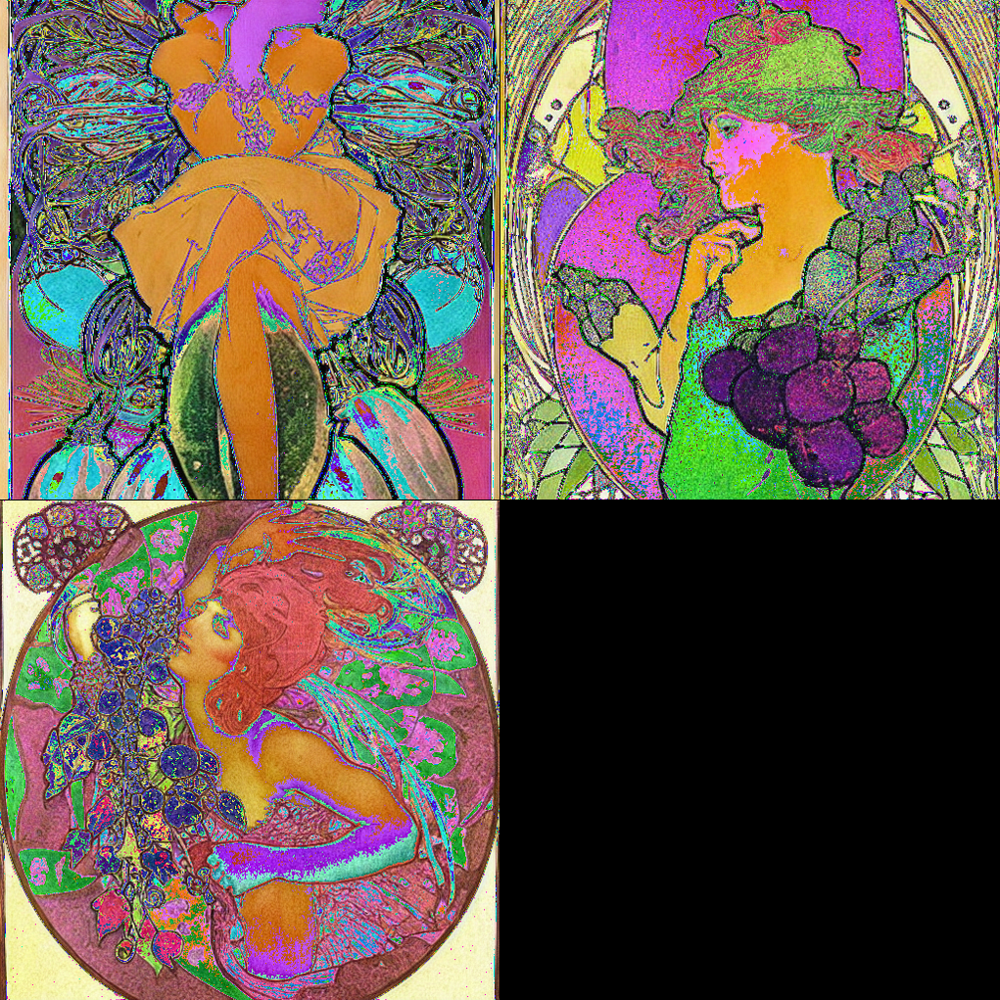

In [20]:
auto("torch,float32,BCHW,RGB,0_1",decoded.cpu().fetch())

In [21]:
res = decoded.cpu().fetch()

In [22]:
x = txt2img2.model.first_stage_model.decoder(rz1)

RuledData(data=AutoData2(value=tensor([[[[0.9575, 0.9647, 0.9624,  ..., 0.9043, 0.9104, 0.9234],
          [0.9692, 0.9582, 0.9597,  ..., 0.9059, 0.9219, 0.9180],
          [0.9636, 0.9573, 0.9574,  ..., 0.9132, 0.9143, 0.9254],
          ...,
          [0.9730, 0.9652, 0.9718,  ..., 0.8908, 0.9137, 0.9159],
          [0.9644, 0.9639, 0.9710,  ..., 0.8938, 0.8889, 0.9073],
          [0.9708, 0.9809, 0.9780,  ..., 0.9198, 0.9275, 0.8964]],

         [[0.8688, 0.8955, 0.8862,  ..., 0.8576, 0.8669, 0.8686],
          [0.8851, 0.8887, 0.9022,  ..., 0.8617, 0.8575, 0.8620],
          [0.8871, 0.8910, 0.9074,  ..., 0.8742, 0.8558, 0.8793],
          ...,
          [0.8886, 0.8910, 0.9011,  ..., 0.8298, 0.8207, 0.8294],
          [0.9075, 0.8901, 0.9023,  ..., 0.8245, 0.8035, 0.8127],
          [0.8891, 0.9158, 0.9157,  ..., 0.8685, 0.8678, 0.8262]],

         [[0.7767, 0.8067, 0.8170,  ..., 0.7120, 0.7132, 0.7212],
          [0.7837, 0.7991, 0.8017,  ..., 0.6936, 0.6838, 0.6951],
          [0.7970, 0.8023, 0.7930,  ..., 0.7083, 0.6871, 0.7158],
          ...,
          [0.7648, 0.7828, 0.7733,  ..., 0.6667, 0.6896, 0.7027],
          [0.7786, 0.7775, 0.7822,  ..., 0.6687, 0.6620, 0.6966],
          [0.7800, 0.8059, 0.7907,  ..., 0.7178, 0.7147, 0.6974]]],


        [[[0.8646, 0.8897, 0.8802,  ..., 0.2250, 0.1796, 0.3853],
          [0.8013, 0.9163, 0.8897,  ..., 0.0000, 0.2398, 0.5787],
          [0.7939, 0.7961, 0.7767,  ..., 0.0000, 0.1843, 0.4896],
          ...,
          [0.9224, 0.9331, 0.9710,  ..., 0.0359, 0.6430, 0.8466],
          [0.9349, 0.9172, 0.9637,  ..., 0.0741, 0.4565, 0.8617],
          [0.9137, 0.8846, 0.9506,  ..., 0.0355, 0.2560, 0.7797]],

         [[0.8058, 0.8640, 0.8371,  ..., 0.3193, 0.1950, 0.3073],
          [0.7620, 0.8470, 0.7956,  ..., 0.0000, 0.2896, 0.5642],
          [0.7758, 0.7142, 0.6996,  ..., 0.0000, 0.2201, 0.5227],
          ...,
          [0.8912, 0.9339, 0.9747,  ..., 0.0137, 0.6932, 0.8172],
          [0.9234, 0.8779, 0.9650,  ..., 0.0351, 0.4627, 0.8675],
          [0.9126, 0.8811, 0.9544,  ..., 0.0534, 0.1530, 0.6898]],

         [[0.6024, 0.6270, 0.6194,  ..., 0.2829, 0.1755, 0.2439],
          [0.5854, 0.5799, 0.5067,  ..., 0.0663, 0.2544, 0.5783],
          [0.6036, 0.4790, 0.3904,  ..., 0.0073, 0.1804, 0.4285],
          ...,
          [0.4859, 0.6402, 0.6697,  ..., 0.0237, 0.4491, 0.6356],
          [0.6406, 0.6654, 0.7093,  ..., 0.0342, 0.2764, 0.6326],
          [0.6663, 0.7028, 0.7096,  ..., 0.0173, 0.0705, 0.4516]]],


        [[[0.3200, 0.2089, 0.7422,  ..., 0.4401, 0.2181, 0.3645],
          [0.2701, 0.1725, 0.8166,  ..., 0.4422, 0.2276, 0.2647],
          [0.2444, 0.1559, 0.7864,  ..., 0.4412, 0.1895, 0.1742],
          ...,
          [0.1905, 0.2039, 0.1890,  ..., 0.1889, 0.2513, 0.1250],
          [0.2109, 0.2332, 0.2199,  ..., 0.2036, 0.2175, 0.1579],
          [0.1821, 0.2183, 0.2038,  ..., 0.1711, 0.1626, 0.1940]],

         [[0.2343, 0.1420, 0.7106,  ..., 0.3806, 0.1221, 0.2687],
          [0.1993, 0.1347, 0.8063,  ..., 0.3603, 0.1383, 0.1551],
          [0.1947, 0.1232, 0.7604,  ..., 0.3601, 0.1406, 0.1096],
          ...,
          [0.1108, 0.1060, 0.1003,  ..., 0.1019, 0.1906, 0.0464],
          [0.1071, 0.1124, 0.1050,  ..., 0.0935, 0.1606, 0.1052],
          [0.0875, 0.1067, 0.1050,  ..., 0.0946, 0.0897, 0.1104]],

         [[0.1439, 0.0639, 0.6244,  ..., 0.3176, 0.1052, 0.2132],
          [0.1341, 0.0630, 0.6477,  ..., 0.2789, 0.0914, 0.1385],
          [0.1649, 0.0967, 0.6412,  ..., 0.3111, 0.1309, 0.1202],
          ...,
          [0.0523, 0.0754, 0.0584,  ..., 0.0870, 0.1313, 0.0345],
          [0.0636, 0.0825, 0.0786,  ..., 0.0923, 0.1273, 0.0680],
          [0.0671, 0.0893, 0.0832,  ..., 0.0839, 0.0709, 0.0857]]]]), format='torch,float32,BCHW,RGB,0_1'), rulebook=AutoRuleBook(id=8df11c837aa0d477ab9b5720926a01c6)
  index  rules
-------  -----------------------------------------------------------------------------------------------------------------------------
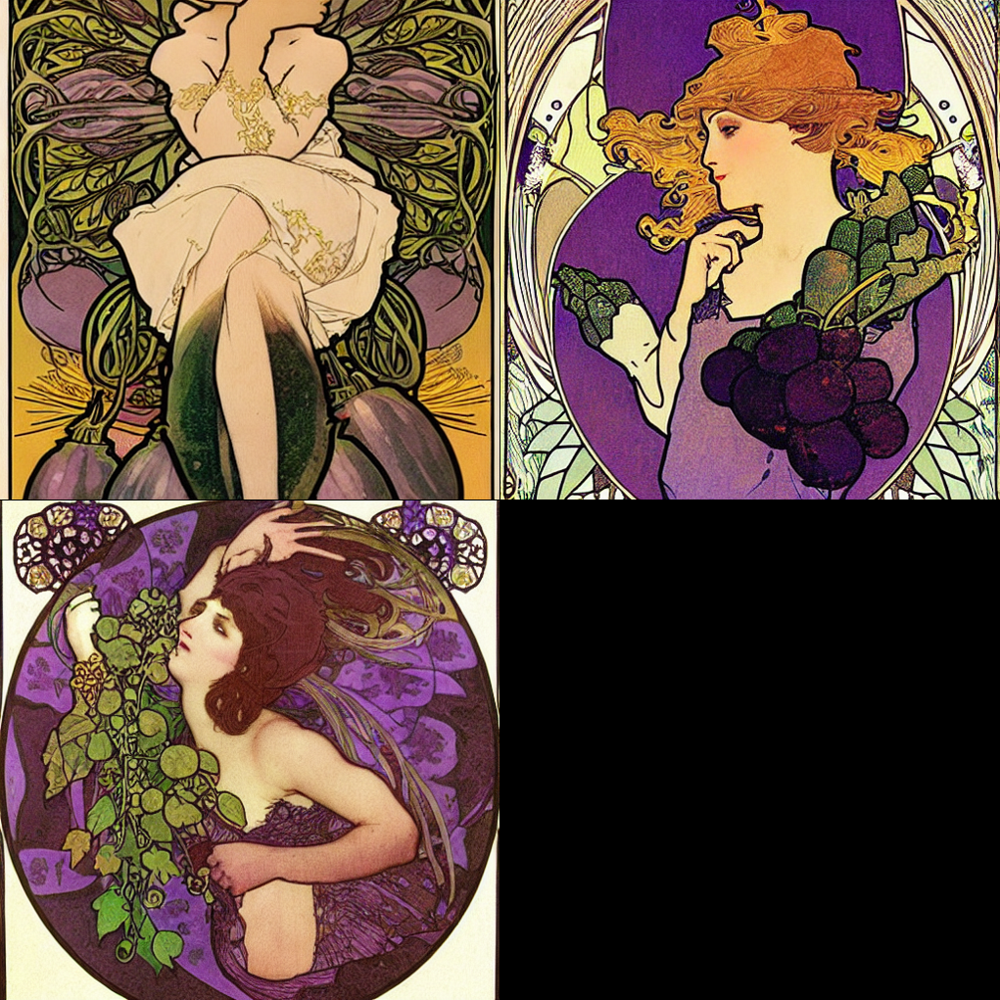

In [23]:

auto("torch,float32,BCHW,RGB,0_1",((decoded.add(1).div(2)).clamp(0,1).cpu().fetch()))

In [24]:
txt2img.model.first_stage_model.encoder.resolution == 256
# the resolution is 256, but the decoded result is 512px. how.so?
# what I am trying to see, is that 
# the resolution and preprocessing we should do for the autoencoder.
# the resolution is set to 256 for dataloader. but the model generates 512px image. why is that.


Var@zeus:(True)

In [25]:
# ok, decoding is not as straight forward as you think it would be.
# there are some quantization, weighting and other stuff which you dont know.
# so the decoder is also very important. I think.
# but can you encode and decode anime image for example?
# in that case you dont need to retrain the decoder.
# I feel like the decoder is not aware of any semantics, but only aware of the texture stuff.


In [26]:
# lets load some anime illusts to see whats coming
from archpainter.experiments.config.config_aliases import find_cfg_by_alias
cfg=find_cfg_by_alias("nian") + dict(job_type="stable-diffusion-inspection")


examining modified times...: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 54391.21it/s]
/Users/kento/.conda/envs/archpainter_310_ptm1_2/lib/python3.10/site-packages/hub/util/check_latest_version.py:32: UserWarning: A newer version of hub (2.7.5) is available. It's recommended that you update to the latest version using `pip install -U hub`.
  warnings.warn(
examining modified times...: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 34689.73it/s]
2022-08-28 20:29:04.214 | DEBUG    | data_tree.coconut.astar:__init__:299 - using autodata search cach

2022-08-28 20:52:31.879 | INFO     | archpainter.experiments.config.config:remote_env:228 - starting a remote environment with options: {}


(PyEnvironment pid=76877) PyEnvironment created at zeus


(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:33.988 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:33.988 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:33.988 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:33.989 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:33.990 | INFO     | archpainter:get_storage_manager:78 - PID:76877	host:zeus
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:33.992 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/intern

(Env@zeus(id=b6903...,0 instances) pid=76877) trying to register rp_serializer


(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:37.314 | DEBUG    | data_tree.coconut.astar:__init__:299 - using autodata search cache at /home/kento/.cache/autodata.shelve
examining modified times...: 100%|██████████| 22/22 [00:00<00:00, 131820.98it/s]
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:38.423 | WARNING  | pinject_design.di.util:bind_instance:284 - spade_net_d_class is bound to class <class 'archpainter.spade.discriminator.MultiscaleDiscriminator'> with 'bind_instance' do you mean 'bind_class'?
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:38.423 | WARNING  | pinject_design.di.util:bind_instance:284 - spade_net_e_class is bound to class <class 'archpainter.spade.encoder.ConvEncoder'> with 'bind_instance' do you mean 'bind_class'?
(Env@zeus(id=b6903...,0 instances) pid=76877) 2022-08-28 11:52:38.432 | DEBUG    | data_tree.coconut.astar:__init__:299 - using autodata search cache at /home/kento/.cache/autodata.shelve
(Env@zeus(i

In [27]:
g = cfg.exp_graph()

In [29]:
from archpainter.my_artifacts.objects.db2020_original import db2020_original_remote_image_store_on_zeus
imstore = g[db2020_original_remote_image_store_on_zeus]

2022-08-28 20:31:19.309 | INFO     | archpainter.experiments.config.config:remote_env:228 - starting a remote environment with options: {'resources': {'zeus': 1}}


(PyEnvironment pid=75161) PyEnvironment created at zeus


(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:21.676 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:638 - patching pinject's SingletonScope to produce better exception
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:21.676 | WARNING  | pinject_design.di.util:patch_pinject_singleton_scope:640 - patching done
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:21.676 | WARNING  | pinject_design.di.util:patch_pinject_get_external_type_name:664 - patching pinject's _get_external_type_name to accept pickled function
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:21.677 | DEBUG    | archpainter:<module>:14 - home directory:/home/kento
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:21.677 | INFO     | archpainter:get_storage_manager:78 - PID:75161	host:zeus
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:21.679 | INFO     | data_tree.storage_manager:__init__:47 - scan targets:['/intern

(Env@zeus(id=ef745...,0 instances) pid=75161) trying to register rp_serializer


(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:24.593 | INFO     | ray_jobs.remote_proxy:register_rp_serializer:217 - registered RemoteProxy serializer!
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:25.066 | DEBUG    | data_tree.coconut.astar:__init__:299 - using autodata search cache at /home/kento/.cache/autodata.shelve
examining modified times...: 100%|██████████| 22/22 [00:00<00:00, 137929.28it/s]
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:26.014 | WARNING  | pinject_design.di.util:bind_instance:284 - spade_net_d_class is bound to class <class 'archpainter.spade.discriminator.MultiscaleDiscriminator'> with 'bind_instance' do you mean 'bind_class'?
(Env@zeus(id=ef745...,0 instances) pid=75161) 2022-08-28 11:31:26.014 | WARNING  | pinject_design.di.util:bind_instance:284 - spade_net_e_class is bound to class <class 'archpainter.spade.encoder.ConvEncoder'> with 'bind_instance' do you mean 'bind_class'?
(Env@zeus(id=ef745...,0 instan

In [30]:
db2020_pairs = imstore.sorted_pairs()

In [31]:
db2020_pairs

interactive(children=(Dropdown(description='visualization', options={'trace': interactive(children=(IntSlider(…

In [67]:
# now, how are images preprocessed?
# and how can we fine tune? I dont find the training code..
# ah it was in main.py :)
img_name,img = db2020_pairs[2049422]
aimg = auto("image,RGB,RGB",img)

In [49]:
x_batch_fmt = "pix2pix_batch,nc=3"
x_fmt = "pix2pix,nc=3"
x_batch_fmt = "torch,float32,BCHW,RGB,imagenet"
x_fmt = "torch,float32,CHW,RGB,imagenet"
x_batch_fmt = "torch,float32,BCHW,RGB,0_1"
x_fmt = "torch,float32,CHW,RGB,0_1"
timg = auto("image,RGB,RGB",img).to(x_batch_fmt) * 2 - 1 
timg.shape

torch.Size([1, 3, 1464, 992])

In [87]:
AE = txt2img2.model.first_stage_model
def encode_decode(img):
    t = img.to("torch,float32,BCHW,RGB,0_1") * 2 -1
    print(f"input img shape:{t.shape}")
    rt = txt2img2.env.put(t).to(txt2img2.device)
    z_posterior = AE.encode(rt)
    z = z_posterior.sample()
    print(f"z shape:{z.shape}")
    x = AE.decode(z) 
    rec_img = auto("torch,float32,CHW,RGB,0_1",(x[0].add(1).div(2)).clamp(0,1).cpu().fetch())
    return dict(
        x = rt,
        z = z,
        x_hat = x,
        x_hat_img = rec_img
    )
    

In [88]:
encode_decode(auto("image,RGB,RGB",img))

input img shape:torch.Size([1, 3, 1464, 992])
z shape:Var@zeus:(torch.Size([1, 4, 183, 124]))


{'x': Var@zeus:(tensor([[[[1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           ...,
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.]],
 
          [[1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           ...,
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.]],
 
          [[1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           ...,
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           [1., 1., 1.,  ..., 1., 1., 1.]]]], device='cuda:0')),
 'z': Var@zeus:(tensor([[[[ 1.3433e+01,  1.2685e+01,  1.2214e+01,  ...,  1.3724e+01,
             1.1321e+01,  1.1293e+01],
           

In [51]:

rtimg = txt2img2.env.put(timg)
rtimg
z_posterior = AE.encode(rtimg.to(txt2img2.device))
z_posterior


Var@zeus:(<ldm.modules.distributions.distributions.DiagonalGaussianDistribution object at 0x7fcfe9d07c70>)

In [52]:
z = z_posterior.sample()
z.shape

Var@zeus:(torch.Size([1, 4, 183, 124]))

In [57]:
z1 = z_posterior.sample()
z2 = z_posterior.sample()

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 2.000e+00,
        3.000e+00, 1.000e+00, 7.000e+00, 5.000e+00, 7.000e+00, 1.300e+01,
        1.100e+01, 2.900e+01, 2.900e+01, 4.000e+01, 4.600e+01, 5.600e+01,
        8.200e+01, 9.600e+01, 1.000e+02, 1.550e+02, 1.610e+02, 2.010e+02,
        2.740e+02, 3.390e+02, 4.490e+02, 8.150e+02, 1.042e+03, 1.098e+03,
        7.722e+03, 9.030e+02, 1.090e+03, 9.440e+02, 1.048e+03, 1.122e+03,
        1.145e+03, 1.212e+03, 1.289e+03, 1.350e+03, 1.341e+03, 1.425e+03,
        1.429e+03, 1.532e+03, 1.710e+03, 1.504e+03, 1.656e+03, 8.001e+03,
        2.203e+03, 1.852e+03, 1.522e+03, 1.430e+03, 1.347e+03, 1.221e+03,
        1.294e+03, 1.184e+03, 1.144e+03, 1.135e+03, 1.096e+03, 1.091e+03,
        9.430e+02, 9.930e+02, 9.000e+02, 8.940e+02, 9.000e+02, 8.410e+02,
        8.840e+02, 8.350e+02, 8.830e+02, 1.252e+03, 7.667e+03, 1.365e+03,
        8.430e+02, 7.430e+02, 8.630e+02, 6.030e+02, 1.174e+03, 1.064e+03,
        7.202e+03, 4.790e+02, 4.480e+0

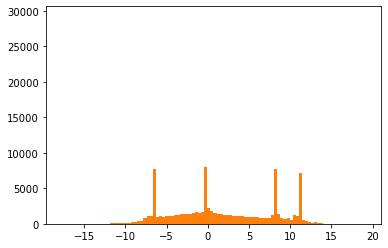

In [63]:
plt.hist((z1 - z2).cpu().numpy().flatten().fetch(),bins=100)
plt.hist(z1.cpu().numpy().flatten().fetch(),bins=100)

RuledData(data=AutoData2(value=tensor([[[ 1.3433e+01,  1.2685e+01,  1.2214e+01,  ...,  1.3724e+01,
           1.1321e+01,  1.1293e+01],
         [ 1.3982e+01,  1.1177e+01,  1.0723e+01,  ...,  1.1021e+01,
           1.0067e+01,  1.0868e+01],
         [ 1.3146e+01,  1.1109e+01,  1.1088e+01,  ...,  1.1339e+01,
           1.0252e+01,  1.0368e+01],
         ...,
         [ 1.3398e+01,  1.1152e+01,  1.1233e+01,  ...,  1.1509e+01,
           1.0565e+01,  1.0635e+01],
         [ 1.2189e+01,  1.0777e+01,  1.0358e+01,  ...,  1.0554e+01,
           9.9719e+00,  1.0015e+01],
         [ 1.0275e+01,  1.0087e+01,  1.2838e+01,  ...,  1.2786e+01,
           9.7041e+00,  1.2305e+01]],

        [[ 1.3263e+01,  1.2432e+01,  1.0304e+01,  ...,  1.0861e+01,
           9.4855e+00,  9.4794e+00],
         [ 1.3669e+01,  1.0814e+01,  8.9600e+00,  ...,  8.2800e+00,
           8.5735e+00,  1.0918e+01],
         [ 1.1829e+01,  9.4321e+00,  8.2068e+00,  ...,  7.7380e+00,
           7.6854e+00,  1.0018e+01],
         ...,
         [ 1.2021e+01,  9.6573e+00,  8.4958e+00,  ...,  8.2175e+00,
           7.7230e+00,  1.0107e+01],
         [ 1.1888e+01,  9.3565e+00,  8.4272e+00,  ...,  7.8792e+00,
           8.3335e+00,  1.0487e+01],
         [ 1.2188e+01,  1.0213e+01,  1.0059e+01,  ...,  9.3590e+00,
           9.7016e+00,  1.2400e+01]],

        [[-6.6445e+00, -5.0893e+00, -3.2308e+00,  ..., -2.5623e+00,
          -2.7150e+00, -2.3641e+00],
         [-7.2033e+00, -2.1758e+00, -1.2821e-01,  ..., -4.1159e-01,
           4.4644e-01, -8.1814e-02],
         [-5.8425e+00, -1.3711e+00,  2.4004e-01,  ...,  6.3332e-02,
           5.3873e-01, -1.3329e-01],
         ...,
         [-5.5190e+00, -1.2479e+00,  3.8409e-01,  ...,  3.9426e-01,
           1.3822e+00,  1.4083e-01],
         [-3.7700e+00, -7.2349e-01,  6.3169e-01,  ...,  8.8470e-01,
           1.3145e+00, -4.1853e-03],
         [-5.8707e+00,  1.1115e+00,  2.3740e+00,  ...,  1.6371e+00,
           1.3487e+00,  2.7861e+00]],

        [[-6.4702e+00, -6.8609e+00, -6.5322e+00,  ..., -4.9997e+00,
          -7.2549e+00, -7.6110e+00],
         [-7.4758e+00, -8.8616e+00, -7.8410e+00,  ..., -7.5584e+00,
          -8.1127e+00, -6.9137e+00],
         [-7.5757e+00, -8.0397e+00, -6.7859e+00,  ..., -6.7219e+00,
          -7.5595e+00, -7.1196e+00],
         ...,
         [-7.1700e+00, -7.6572e+00, -6.5290e+00,  ..., -6.7291e+00,
          -7.1359e+00, -7.0335e+00],
         [-7.2819e+00, -7.8317e+00, -7.1539e+00,  ..., -7.3620e+00,
          -7.4534e+00, -7.2538e+00],
         [-8.2377e+00, -7.5903e+00, -5.0663e+00,  ..., -5.8321e+00,
          -7.4364e+00, -4.4508e+00]]]), format='torch,float32,CHW,RGBA,None'), rulebook=AutoRuleBook(id=8df11c837aa0d477ab9b5720926a01c6)
  index  rules
-------  ------------------------------------------------------------------------------------------------------------------------------------------------------------------------
      0  ConversionLambda(rule=<function imdef_neighbors at 0x127cac0d0>, cost=1)
      1  ConversionLambda(rule=<function rule_xyz_to_rgb at 0x127ca79a0>, cost=1)
      2  ConversionLambda(rule=<function rule_batch_xyz_to_rgb at 0x127ca7c70>, cost=1)
      3  ConversionLambda(rule=<function rule_VR_None_to_normalized at 0x127cac1f0>, cost=1)
      4  ConversionLambda(rule=<function rule_add_channel at 0x127cac3a0>, cost=1)
      5  ConversionLambda(rule=<function rule_swap_RGB_BGR at 0x127cac430>, cost=1)
      6  CastLambda(rule=<function cast_imdef_to_dict at 0x133c7b9a0>, name='cast_imdef_to_dict', cost=1)
      7  CastLambda(rule=<function cast_imdef_str_to_imdef at 0x133c7ba30>, name='cast_imdef_str_to_imdef', cost=1)
      8  CastLambda(rule=<function cast_imdef_to_imdef_str at 0x133c7bb50>, name='cast_imdef_to_imdef_str', cost=1)
      9  CastLambda(rule=<function dict2imdef at 0x133ca0040>, name='dict2imdef', cost=1)
     10  CastLambda(rule=<function cast_ary_str_to_ary_type at 0x133ca1090>, name='cast_ary_str_to_ary_type', cost=1)
     11  CastLambda(rule=<function 
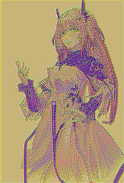

In [53]:
auto("torch,float32,CHW,RGBA,None",z[0].cpu().fetch())

In [54]:
x = AE.decode(z)
x.shape

Var@zeus:(torch.Size([1, 3, 1464, 992]))

In [64]:
#auto("torch,float32,CHW,RGB,0_1",x[0].cpu().fetch())

In [68]:
rec_img = auto("torch,float32,CHW,RGB,0_1",(x[0].add(1).div(2)).clamp(0,1).cpu().fetch())

RuledData(data=AutoData2(value=array([[[-4.7142506e-03, -9.9053979e-03, -1.4654636e-02, ...,
         -5.4047704e-03, -1.3561189e-02, -1.2667775e-02],
        [-1.2824297e-02, -1.6953826e-02, -1.3055801e-02, ...,
         -1.4170468e-02, -1.2333453e-02,  0.0000000e+00],
        [-1.6056776e-02, -1.4805317e-02, -1.9359410e-02, ...,
         -1.1588335e-02, -8.8009834e-03,  0.0000000e+00],
        ...,
        [ 0.0000000e+00, -7.1956515e-03,  0.0000000e+00, ...,
         -6.9718957e-03, -1.6710162e-03,  0.0000000e+00],
        [-5.9667826e-03, -7.4098706e-03,  0.0000000e+00, ...,
         -6.3123107e-03, -3.3861995e-03,  0.0000000e+00],
        [-9.9105835e-03,  0.0000000e+00, -6.9864392e-03, ...,
         -8.7048411e-03, -3.4434795e-03, -1.1865139e-02]],

       [[-1.7735004e-02, -4.8792362e-03, -1.0443926e-02, ...,
         -9.8414421e-03, -7.3370934e-03, -5.9748888e-03],
        [-1.7191172e-03, -1.3912916e-02, -9.1490746e-03, ...,
         -7.6558590e-03, -8.7064505e-03, -4.7349930e-04],
        [-1.9887328e-02, -7.8889132e-03, -1.4613509e-02, ...,
         -1.0601282e-02, -2.5085211e-03, -7.8355074e-03],
        ...,
        [-1.0383129e-04, -6.2096119e-04, -1.2433529e-03, ...,
         -4.2835474e-03, -3.3308268e-03,  0.0000000e+00],
        [ 0.0000000e+00, -5.1050186e-03, -2.5042295e-03, ...,
         -4.3938160e-03,  0.0000000e+00,  0.0000000e+00],
        [-1.0236263e-02,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00]],

       [[-1.5542507e-02, -8.7401867e-03,  0.0000000e+00, ...,
         -6.5937042e-03,  0.0000000e+00, -1.4754653e-02],
        [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         -4.8694611e-03, -1.8141270e-03,  0.0000000e+00],
        [ 0.0000000e+00,  0.0000000e+00, -3.5463572e-03, ...,
         -5.4405928e-03, -4.6914816e-03,  0.0000000e+00],
        ...,
        [-2.7537346e-05,  0.0000000e+00, -7.4222088e-03, ...,
         -8.4301233e-03, -6.2439442e-03,  0.0000000e+00],
        [ 0.0000000e+00, -6.4138174e-03, -1.7474890e-03, ...,
         -1.0297537e-02, -9.8708868e-03,  0.0000000e+00],
        [-2.2013545e-02,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00, -2.3944080e-02]]], dtype=float32), format='numpy,float32,CHW,RGB,None'), rulebook=AutoRuleBook(id=8df11c837aa0d477ab9b5720926a01c6)
  index  rules
-------  ------------------------------------------------------------------------------------------------------------------------------------------------------------------------
      0  ConversionLambda(rule=<function imdef_neighbors at 0x127cac0d0>, cost=1)
      1  ConversionLambda(rule=<function rule_xyz_to_rgb at 0x127ca79a0>, cost=1)
      2  ConversionLambda(rule=<function rule_batch_xyz_to_rgb at 0x127ca7c70>, cost=1)
      3  ConversionLambda(rule=<function rule_VR_None_to_normalized at 0x127cac1f0>, cost=1)
      4  ConversionLambda(rule=<function rule_add_channel at 0x127cac3a0>, cost=1)
      5  ConversionLambda(rule=<function rule_swap_RGB_BGR at 0x127cac430>, cost=1)
      6  CastLambda(rule=<function cast_imdef_to_dict at 0x133c7b9a0>, name='cast_imdef_to_dict', cost=1)
      7  CastLambda(rule=<function cast_imdef_str_to_imdef at 0x133c7ba30>, name='cast_imdef_str_to_imdef', cost=1)
      8  CastLambda(rule=<function cast_imdef_to_imdef_str at 0x133c7bb50>, name='cast_imdef_to_imdef_str', cost=1)
      9  CastLambda(rule=<function dict2imdef at 0x133ca0040>, name='dict2imdef', cost=1)
     10  CastLambda(rule=<function cast_ary_str_to_ary_type at 0x133ca1090>, name='cast_ary_str_to_ary_type', cost=1)
     11  CastLambda(rule=<function img_list_is_imgs at 0x133ca1750>, name='img_list_is_imgs', cost=1)
     12  CastLambda(rule=<function lll_is_rgb at 0x133ca1ea0>, name='lll_is_rgb', cost=10)
     13  CastLambda(rule=<function cast_tuple2auto_tuple at 0x133ca0e50>, name='tuple <--> auto_tuple', cost=1)
     14  ConversionLambda(rule=<function any2widget at 0x133ca2440>, cost=1)
     15  Conversio
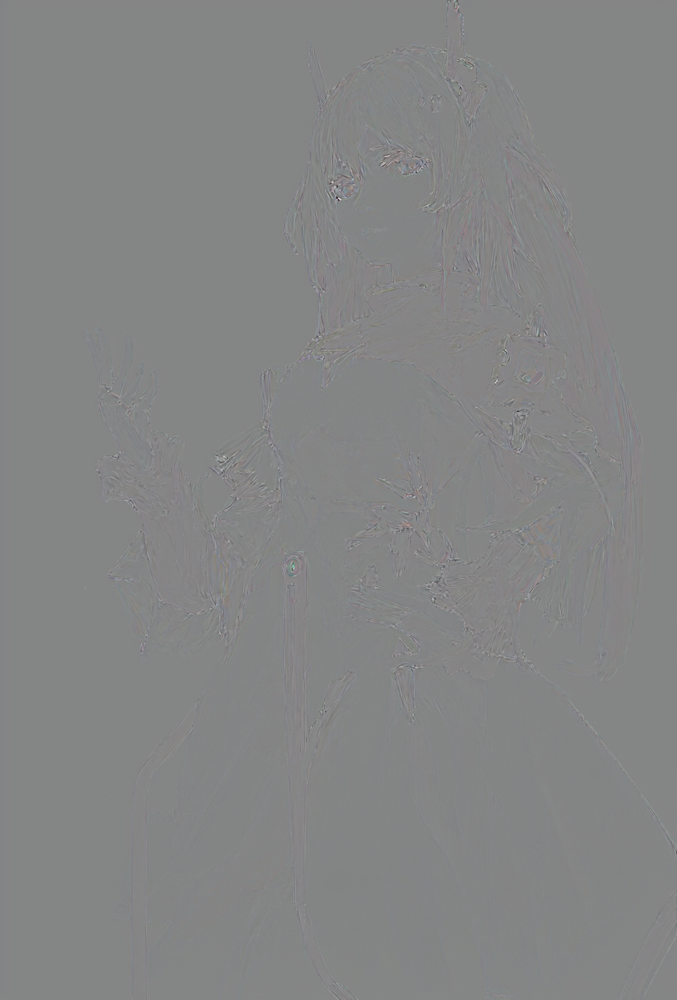

(array([2.000000e+00, 1.000000e+00, 0.000000e+00, 1.000000e+00,
        0.000000e+00, 1.000000e+00, 2.000000e+00, 1.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        2.000000e+00, 0.000000e+00, 1.000000e+00, 2.000000e+00,
        1.000000e+00, 2.000000e+00, 2.000000e+00, 3.000000e+00,
        4.000000e+00, 5.000000e+00, 0.000000e+00, 4.000000e+00,
        0.000000e+00, 1.000000e+00, 2.000000e+00, 5.000000e+00,
        5.000000e+00, 3.000000e+00, 2.000000e+00, 1.100000e+01,
        4.000000e+00, 1.500000e+01, 1.700000e+01, 2.500000e+01,
        1.000000e+01, 1.800000e+01, 2.600000e+01, 4.000000e+01,
        4.400000e+01, 5.800000e+01, 7.100000e+01, 9.900000e+01,
        1.000000e+02, 1.520000e+02, 1.750000e+02, 1.990000e+02,
        2.180000e+02, 2.500000e+02, 3.570000e+02, 4.800000e+02,
        6.470000e+02, 9.480000e+02, 1.184000e+03, 1.499000e+03,
        2.136000e+03, 2.980000e+03, 4.352000e+03, 6.368000e+03,
        9.582000e+03, 1.472900e+04, 2.43

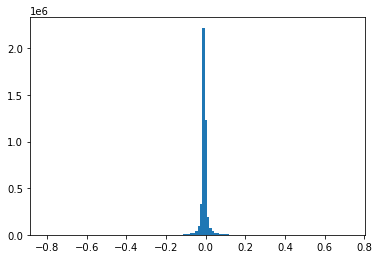

In [75]:
img_fmt = "numpy,float32,CHW,RGB,0_1"
diff = rec_img.to(img_fmt) - aimg.to(img_fmt)
display(auto("numpy,float32,CHW,RGB,None",diff))
plt.hist(diff.flatten(),bins=128)


RuledData(data=AutoData2(value=<PIL.Image.Image image mode=RGB size=992x1464 at 0x2CBF77C70>, format='image,RGB,RGB'), rulebook=AutoRuleBook(id=8df11c837aa0d477ab9b5720926a01c6)
  index  rules
-------  ------------------------------------------------------------------------------------------------------------------------------------------------------------------------
      0  ConversionLambda(rule=<function imdef_neighbors at 0x127cac0d0>, cost=1)
      1  ConversionLambda(rule=<function rule_xyz_to_rgb at 0x127ca79a0>, cost=1)
      2  ConversionLambda(rule=<function rule_batch_xyz_to_rgb at 0x127ca7c70>, cost=1)
      3  ConversionLambda(rule=<function rule_VR_None_to_normalized at 0x127cac1f0>, cost=1)
      4  ConversionLambda(rule=<function rule_add_channel at 0x127cac3a0>, cost=1)
      5  ConversionLambda(rule=<function rule_swap_RGB_BGR at 0x127cac430>, cost=1)
      6  CastLambda(rule=<function cast_imdef_to_dict at 0x133c7b9a0>, name='cast_imdef_to_dict', cost=1)
      7  CastLambda(rule=<function cast_imdef_str_to_imdef at 0x133c7ba30>, name='cast_imdef_str_to_imdef', cost=1)
      8  CastLambda(rule=<function cast_imdef_to_imdef_str at 0x133c7bb50>, name='cast_imdef_to_imdef_str', cost=1)
      9  CastLambda(rule=<function dict2imdef at 0x133ca0040>, name='dict2imdef', cost=1)
     10  CastLambda(rule=<function cast_ary_str_to_ary_type at 0x133ca1090>, name='cast_ary_str_to_ary_type', cost=1)
     11  CastLambda(rule=<function img_list_is_imgs at 0x133ca1750>, name='img_list_is_imgs', cost=1)
     12  CastLambda(rule=<function lll_is_rgb at 0x133ca1ea0>, name='lll_is_rgb', cost=10)
     13  CastLambda(rule=<function cast_tuple2auto_tuple at 0x133ca0e50>, name='tuple <--> auto_tuple', cost=1)
     14  ConversionLambda(rule=<function any2widget at 0x133ca2440>, cost=1)
     15  ConversionLambda(rule=<function rule_format at 0x133ca01f0>, cost=1)
     16  ConversionLambda(rule=<function rule_imgs2tile at 0x133c7bd00>, cost=1)
     17  ConversionLambda(rule=<function rule_batch_to_tiled at 0x133c7beb0>, cost=1)
     18  ConversionLambda(rule=<function rule_img2widget at 0x133c7bf40>, cost=1)
     19  ConversionLambda(rule=<function rule_numpy2img at 0x133ca00d0>, cost=1)
     20  ConversionLambda(rule=<function rule_image2gray at 0x133ca04c0>, cost=1)
     21  ConversionLambda(rule=<function rule_image_path_to_image at 0x133ca0160>, cost=1)
     22  ConversionLambda(rule=<function rule_image_str_to_jpg_bytes at 0x133ca2320>, cost=1)
     23  ConversionLambda(rule=<function rule_image2lab at 0x133ca0550>, cost=1)
     24  ConversionLambda(rule=<function rule_lab_value_conversion at 0x133ca0700>, cost=1)
     25  ConversionLambda(rule=<function numpys_to_numpy at 0x133ca17e0>, cost=1)
     26  ConversionLambda(rule=<function tensor_to_list at 0x133ca1870>, cost=1)
     27  ConversionLambda(rule=<function rule_to_hsv at 0x133ca2d40>, cost=1)
     28  ConversionLambda(rule=<function rgb_to_rgba at 0x133ca1900>, cost=1)
     29  ConversionLambda(rule=<function repeat_ch at 0x133ca1e10>, cost=1)
     30  ConversionLambda(rule=<function torch_img_to_pixpix_input at 0x133ca1990>, cost=1)
     31  ConversionLambda(rule=<function torch_img_to_vgg_prep at 0x133ca1d80>, cost=1)
     32  ConversionLambda(rule=<function rule_to_spectrum at 0x133ca0310>, cost=1)
     33  ConversionLambda(rule=<function auto_tuple2widget at 0x133ca24d0>, cost=1)
     34  CastLambda(rule=<function create_alias_rule.<locals>.caster at 0x133ca2dd0>, name='alias:numpy_rgb==numpy,uint8,HWC,RGB,0_255', cost=1)
     35  CastLambda(rule=<function create_alias_rule.<locals>.caster at 0x133ca2e60>, name='alias:numpy_rgba==numpy,uint8,HWC,RGBA,0_255', cost=1)
     36  ConversionLambda(rule=<function make_rule.<locals>._inner.<locals>.rule_impl at 0x133ca27a0>, cost=1)
     37  ConversionLambda(rule=<function make_rule.<locals>._inner.<locals>.rule_impl at 0x133ca28c0>, cost=1)
     38  ConversionLambda(rule=<function make_rule.<locals>._inner.<locals>.rule_impl
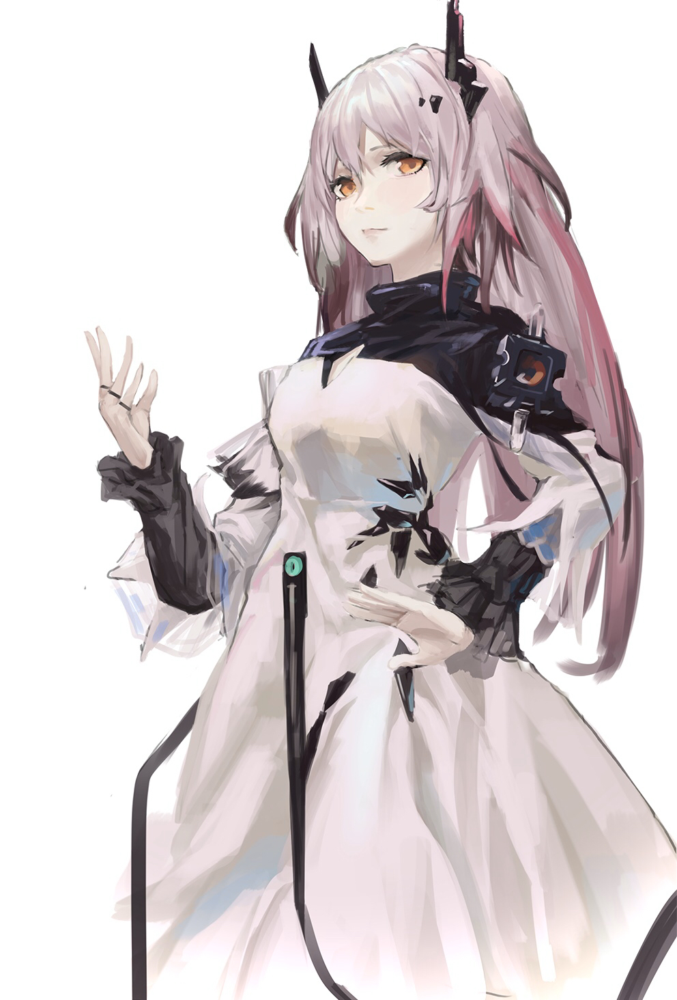

RuledData(data=AutoData2(value=tensor([[[0.9953, 0.9901, 0.9853,  ..., 0.9946, 0.9864, 0.9873],
         [0.9872, 0.9830, 0.9869,  ..., 0.9858, 0.9877, 1.0000],
         [0.9839, 0.9852, 0.9806,  ..., 0.9884, 0.9912, 1.0000],
         ...,
         [1.0000, 0.9928, 1.0000,  ..., 0.9930, 0.9983, 1.0000],
         [0.9940, 0.9926, 1.0000,  ..., 0.9937, 0.9966, 1.0000],
         [0.9901, 1.0000, 0.9930,  ..., 0.9913, 0.9966, 0.9881]],

        [[0.9823, 0.9951, 0.9896,  ..., 0.9902, 0.9927, 0.9940],
         [0.9983, 0.9861, 0.9909,  ..., 0.9923, 0.9913, 0.9995],
         [0.9801, 0.9921, 0.9854,  ..., 0.9894, 0.9975, 0.9922],
         ...,
         [0.9999, 0.9994, 0.9988,  ..., 0.9957, 0.9967, 1.0000],
         [1.0000, 0.9949, 0.9975,  ..., 0.9956, 1.0000, 1.0000],
         [0.9898, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9845, 0.9913, 1.0000,  ..., 0.9934, 1.0000, 0.9852],
         [1.0000, 1.0000, 1.0000,  ..., 0.9951, 0.9982, 1.0000],
         [1.0000, 1.0000, 0.9965,  ..., 0.9946, 0.9953, 1.0000],
         ...,
         [1.0000, 1.0000, 0.9926,  ..., 0.9916, 0.9938, 1.0000],
         [1.0000, 0.9936, 0.9983,  ..., 0.9897, 0.9901, 1.0000],
         [0.9780, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 0.9761]]]), format='torch,float32,CHW,RGB,0_1'), rulebook=AutoRuleBook(id=8df11c837aa0d477ab9b5720926a01c6)
  index  rules
-------  ------------------------------------------------------------------------------------------------------------------------------------------------------------------------
      0  ConversionLambda(rule=<function imdef_neighbors at 0x127cac0d0>, cost=1)
      1  ConversionLambda(rule=<function rule_xyz_to_rgb at 0x127ca79a0>, cost=1)
      2  ConversionLambda(rule=<function rule_batch_xyz_to_rgb at 0x127ca7c70>, cost=1)
      3  ConversionLambda(rule=<function rule_VR_None_to_normalized at 0x127cac1f0>, cost=1)
      4  ConversionLambda(rule=<function rule_add_channel at 0x127cac3a0>, cost=1)
      5  ConversionLambda(rule=<function rule_swap_RGB_BGR at 0x127cac430>, cost=1)
      6  CastLambda(rule=<function cast_imdef_to_dict at 0x133c7b9a0>, name='cast_imdef_to_dict', cost=1)
      7  CastLambda(rule=<function cast_imdef_str_to_imdef at 0x133c7ba30>, name='cast_imdef_str_to_imdef', cost=1)
      8  CastLambda(rule=<function cast_imdef_to_imdef_str at 0x133c7bb50>, name='cast_imdef_to_imdef_str', cost=1)
      9  CastLambda(rule=<function dict2imdef at 0x133ca0040>, name='dict2imdef', cost=1)
     10  CastLambda(rule=<function cast_ary_str_to_ary_type at 0x133ca1090>, name='cast_ary_str_to_ary_type', cost=1)
     11  CastLambda(rule=<function img_list_is_imgs at 0x133ca1750>, name='img_list_is_imgs', cost=1)
     12  CastLambda(rule=<function lll_is_rgb at 0x133ca1ea0>, name='lll_is_rgb', cost=10)
     13  CastLambda(rule=<function cast_tuple2auto_tuple at 0x133ca0e50>, name='tuple <--> auto_tuple', cost=1)
     14  ConversionLambda(rule=<function any2widget at 0x133ca2440>, cost=1)
     15  ConversionLambda(rule=<function rule_format at 0x133ca01f0>, cost=1)
     16  ConversionLambda(rule=<function rule_imgs2tile at 0x133c7bd00>, cost=1)
     17  ConversionLambda(rule=<function rule_batch_to_tiled at 0x133c7beb0>, cost=1)
     18  ConversionLambda(rule=<function rule_img2widget at 0x133c7bf40>, cost=1)
     19  ConversionLambda(rule=<function rule_numpy2img at 0x133ca00d0>, cost=1)
     20  ConversionLambda(rule=<function rule_image2gray at 0x133ca04c0>, cost=1)
     21  ConversionLambda(rule=<function rule_image_path_to_image at 0x133ca0160>, cost=1)
     22  ConversionLambda(rule=<function rule_image_str_to_jpg_bytes at 0x133ca2320>, cost=1)
     23  ConversionLambda(rule=<function rule_image2lab at 0x133ca0550>, cost=1)
     24  ConversionLambda(rule=<function rule_lab_value_conversion at 0x133ca0700>, cost=1)
     25  ConversionLambda(rule=<function numpys_to_numpy at 0x133ca17e0>, cost=1)
     26  ConversionLambda(rule=<function tensor_to_list at 0x133ca1870>, cost=1)
     27  C
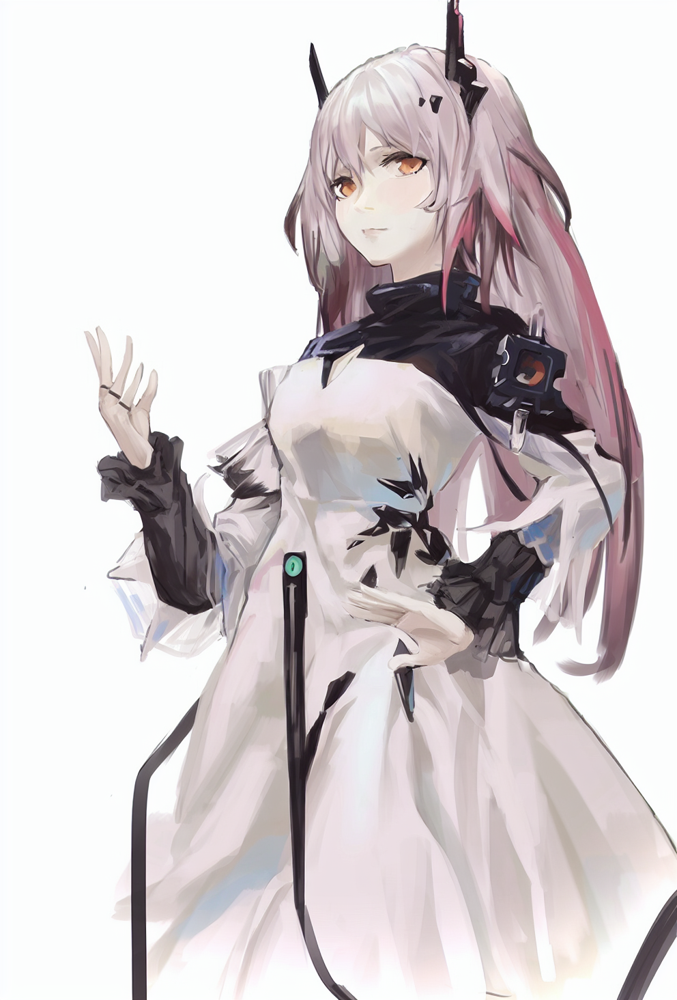

In [69]:
display(aimg)
display(rec_img)

In [ ]:
rg = cfg.remote_graph()


In [80]:
from archpainter.my_artifacts.objects.l2x_db256_alpha_from_sora import db256_alpha_nrm_sora_mlmdb
r_nrms = rg[db256_alpha_nrm_sora_mlmdb]

In [82]:
nrm_pairs = r_nrms.sorted_pairs()

In [94]:
img = auto("image,RGB,RGB",nrm_pairs[2][1].fetch())

In [95]:
res = encode_decode(img)

input img shape:torch.Size([1, 3, 256, 256])
z shape:Var@zeus:(torch.Size([1, 4, 32, 32]))


RuledData(data=AutoData2(value=tensor([[[0.5153, 0.5072, 0.5864,  ..., 0.4779, 0.4987, 0.5165],
         [0.5240, 0.5193, 0.4948,  ..., 0.4732, 0.4629, 0.4948],
         [0.4785, 0.5278, 0.4843,  ..., 0.4646, 0.4561, 0.4921],
         ...,
         [0.5052, 0.5015, 0.4897,  ..., 0.4905, 0.5040, 0.5212],
         [0.5096, 0.5025, 0.4904,  ..., 0.5079, 0.4975, 0.5329],
         [0.4959, 0.5104, 0.5046,  ..., 0.5145, 0.5131, 0.5330]],

        [[0.4716, 0.4575, 0.5701,  ..., 0.4810, 0.4694, 0.4281],
         [0.5255, 0.5480, 0.5190,  ..., 0.4904, 0.4762, 0.4476],
         [0.4898, 0.5552, 0.5240,  ..., 0.4757, 0.4839, 0.4714],
         ...,
         [0.4905, 0.4990, 0.4944,  ..., 0.4756, 0.4726, 0.4550],
         [0.4942, 0.4879, 0.4854,  ..., 0.4673, 0.5073, 0.4574],
         [0.4747, 0.4791, 0.4800,  ..., 0.4748, 0.4803, 0.4505]],

        [[0.0803, 0.0000, 0.0254,  ..., 0.0127, 0.0388, 0.0966],
         [0.0270, 0.0000, 0.0000,  ..., 0.0202, 0.0068, 0.0344],
         [0.0000, 0.0144, 0.0080,  ..., 0.0232, 0.0143, 0.0298],
         ...,
         [0.0196, 0.0290, 0.0146,  ..., 0.0215, 0.0215, 0.0164],
         [0.0322, 0.0069, 0.0000,  ..., 0.0000, 0.0000, 0.0006],
         [0.1342, 0.0518, 0.0228,  ..., 0.0124, 0.0398, 0.0266]]]), format='torch,float32,CHW,RGB,0_1'), rulebook=AutoRuleBook(id=8df11c837aa0d477ab9b5720926a01c6)
  index  rules
-------  ------------------------------------------------------------------------------------------------------------------------------------------------------------------------
      0  ConversionLambda(rule=<function imdef_neighbors at 0x127cac0d0>, cost=1)
      1  ConversionLambda(rule=<function rule_xyz_to_rgb at 0x127ca79a0>, cost=1)
      2  ConversionLambda(rule=<function rule_batch_xyz_to_rgb at 0x127ca7c70>, cost=1)
      3  ConversionLambda(rule=<function rule_VR_None_to_normalized at 0x127cac1f0>, cost=1)
      4  ConversionLambda(rule=<function rule_add_channel at 0x127cac3a0>, cost=1)
      5  ConversionLambda(rule=<function rule_swap_RGB_BGR at 0x127cac430>, cost=1)
      6  CastLambda(rule=<function cast_imdef_to_dict at 0x133c7b9a0>, name='cast_imdef_to_dict', cost=1)
      7  CastLambda(rule=<function cast_imdef_str_to_imdef at 0x133c7ba30>, name='cast_imdef_str_to_imdef', cost=1)
      8  CastLambda(rule=<function cast_imdef_to_imdef_str at 0x133c7bb50>, name='cast_imdef_to_imdef_str', cost=1)
      9  CastLambda(rule=<function dict2imdef at 0x133ca0040>, name='dict2imdef', cost=1)
     10  CastLambda(rule=<function cast_ary_str_to_ary_type at 0x133ca1090>, name='cast_ary_str_to_ary_type', cost=1)
     11  CastLambda(rule=<function img_list_is_imgs at 0x133ca1750>, name='img_list_is_imgs', cost=1)
     12  CastLambda(rule=<function lll_is_rgb at 0x133ca1ea0>, name='lll_is_rgb', cost=10)
     13  CastLambda(rule=<function cast_tuple2auto_tuple at 0x133ca0e50>, name='tuple <--> auto_tuple', cost=1)
     14  ConversionLambda(rule=<function any2widget at 0x133ca2440>, cost=1)
     15  ConversionLambda(rule=<function rule_format at 0x133ca01f0>, cost=1)
     16  ConversionLambda(rule=<function rule_imgs2tile at 0x133c7bd00>, cost=1)
     17  ConversionLambda(rule=<function rule_batch_to_tiled at 0x133c7beb0>, cost=1)
     18  ConversionLambda(rule=<function rule_img2widget at 0x133c7bf40>, cost=1)
     19  ConversionLambda(rule=<function rule_numpy2img at 0x133ca00d0>, cost=1)
     20  ConversionLambda(rule=<function rule_image2gray at 0x133ca04c0>, cost=1)
     21  ConversionLambda(rule=<function rule_image_path_to_image at 0x133ca0160>, cost=1)
     22  ConversionLambda(rule=<function rule_image_str_to_jpg_bytes at 0x133ca2320>, cost=1)
     23  ConversionLambda(rule=<function rule_image2lab at 0x133ca0550>, cost=1)
     24  ConversionLambda(rule=<function rule_lab_value_conversion at 0x133ca0700>, cost=1)
     25  ConversionLambda(rule=<function numpys_to_numpy at 0x133ca17e0>, cost=1)
     26  ConversionLambda(rule=<function tensor_to_list at 0x133ca1870>, cost=1)
     27  C
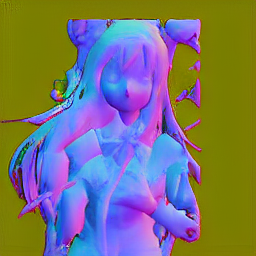

RuledData(data=AutoData2(value=<PIL.PngImagePlugin.PngImageFile image mode=RGB size=256x256 at 0x2B57BE9E0>, format='image,RGB,RGB'), rulebook=AutoRuleBook(id=8df11c837aa0d477ab9b5720926a01c6)
  index  rules
-------  ------------------------------------------------------------------------------------------------------------------------------------------------------------------------
      0  ConversionLambda(rule=<function imdef_neighbors at 0x127cac0d0>, cost=1)
      1  ConversionLambda(rule=<function rule_xyz_to_rgb at 0x127ca79a0>, cost=1)
      2  ConversionLambda(rule=<function rule_batch_xyz_to_rgb at 0x127ca7c70>, cost=1)
      3  ConversionLambda(rule=<function rule_VR_None_to_normalized at 0x127cac1f0>, cost=1)
      4  ConversionLambda(rule=<function rule_add_channel at 0x127cac3a0>, cost=1)
      5  ConversionLambda(rule=<function rule_swap_RGB_BGR at 0x127cac430>, cost=1)
      6  CastLambda(rule=<function cast_imdef_to_dict at 0x133c7b9a0>, name='cast_imdef_to_dict', cost=1)
      7  CastLambda(rule=<function cast_imdef_str_to_imdef at 0x133c7ba30>, name='cast_imdef_str_to_imdef', cost=1)
      8  CastLambda(rule=<function cast_imdef_to_imdef_str at 0x133c7bb50>, name='cast_imdef_to_imdef_str', cost=1)
      9  CastLambda(rule=<function dict2imdef at 0x133ca0040>, name='dict2imdef', cost=1)
     10  CastLambda(rule=<function cast_ary_str_to_ary_type at 0x133ca1090>, name='cast_ary_str_to_ary_type', cost=1)
     11  CastLambda(rule=<function img_list_is_imgs at 0x133ca1750>, name='img_list_is_imgs', cost=1)
     12  CastLambda(rule=<function lll_is_rgb at 0x133ca1ea0>, name='lll_is_rgb', cost=10)
     13  CastLambda(rule=<function cast_tuple2auto_tuple at 0x133ca0e50>, name='tuple <--> auto_tuple', cost=1)
     14  ConversionLambda(rule=<function any2widget at 0x133ca2440>, cost=1)
     15  ConversionLambda(rule=<function rule_format at 0x133ca01f0>, cost=1)
     16  ConversionLambda(rule=<function rule_imgs2tile at 0x133c7bd00>, cost=1)
     17  ConversionLambda(rule=<function rule_batch_to_tiled at 0x133c7beb0>, cost=1)
     18  ConversionLambda(rule=<function rule_img2widget at 0x133c7bf40>, cost=1)
     19  ConversionLambda(rule=<function rule_numpy2img at 0x133ca00d0>, cost=1)
     20  ConversionLambda(rule=<function rule_image2gray at 0x133ca04c0>, cost=1)
     21  ConversionLambda(rule=<function rule_image_path_to_image at 0x133ca0160>, cost=1)
     22  ConversionLambda(rule=<function rule_image_str_to_jpg_bytes at 0x133ca2320>, cost=1)
     23  ConversionLambda(rule=<function rule_image2lab at 0x133ca0550>, cost=1)
     24  ConversionLambda(rule=<function rule_lab_value_conversion at 0x133ca0700>, cost=1)
     25  ConversionLambda(rule=<function numpys_to_numpy at 0x133ca17e0>, cost=1)
     26  ConversionLambda(rule=<function tensor_to_list at 0x133ca1870>, cost=1)
     27  ConversionLambda(rule=<function rule_to_hsv at 0x133ca2d40>, cost=1)
     28  ConversionLambda(rule=<function rgb_to_rgba at 0x133ca1900>, cost=1)
     29  ConversionLambda(rule=<function repeat_ch at 0x133ca1e10>, cost=1)
     30  ConversionLambda(rule=<function torch_img_to_pixpix_input at 0x133ca1990>, cost=1)
     31  ConversionLambda(rule=<function torch_img_to_vgg_prep at 0x133ca1d80>, cost=1)
     32  ConversionLambda(rule=<function rule_to_spectrum at 0x133ca0310>, cost=1)
     33  ConversionLambda(rule=<function auto_tuple2widget at 0x133ca24d0>, cost=1)
     34  CastLambda(rule=<function create_alias_rule.<locals>.caster at 0x133ca2dd0>, name='alias:numpy_rgb==numpy,uint8,HWC,RGB,0_255', cost=1)
     35  CastLambda(rule=<function create_alias_rule.<locals>.caster at 0x133ca2e60>, name='alias:numpy_rgba==numpy,uint8,HWC,RGBA,0_255', cost=1)
     36  ConversionLambda(rule=<function make_rule.<locals>._inner.<locals>.rule_impl at 0x133ca27a0>, cost=1)
     37  ConversionLambda(rule=<function make_rule.<locals>._inner.<locals>.rule_impl at 0x133ca28c0>, cost=1)
     38  ConversionLambda(rule=<function make_rule.<locals>._inner.<lo
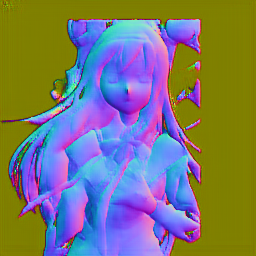

In [101]:
display(res['x_hat_img'])
display(img)

In [115]:
c = txt2img.model.cond_stage_model(["hello world"])
c.shape

Var@zeus:(torch.Size([1, 77, 768]))

(array([1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 8.0000e+00, 5.6000e+01, 1.4000e+01, 1.4000e+01,
        6.1000e+01, 9.5000e+01, 1.7000e+02, 3.6700e+02, 1.6380e+03,
        3.5600e+03, 6.5900e+03, 9.7980e+03, 1.2886e+04, 1.0486e+04,
        7.2930e+03, 3.3520e+03, 1.6890e+03, 6.9500e+02, 8.7000e+01,
        9.2000e+01, 2.6000e+01, 2.5000e+01, 2.0000e+01, 1.5000e+01,
        4.5000e+01, 2.4000e+01, 1.3000e+01, 1.00

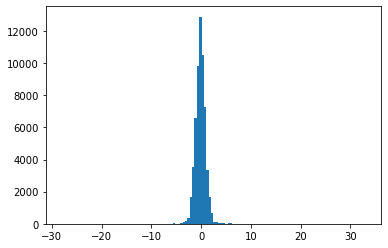

In [116]:
plt.hist(c.cpu().numpy().flatten().fetch(),bins=128)

In [121]:
txt2img.model.first_stage_key

Var@zeus:(jpg)

Log channel is reconnecting. Logs produced while the connection was down can be found on the head node of the cluster in `ray_client_server_[port].out`
2022-08-28 22:57:58,731	WARNING dataclient.py:395 -- Encountered connection issues in the data channel. Attempting to reconnect.
2022-08-28 22:58:27,119	ERROR dataclient.py:322 -- Unrecoverable error in data channel.
Unexpected exception:
Traceback (most recent call last):
  File "/Users/kento/.conda/envs/archpainter_310_ptm1_2/lib/python3.10/site-packages/ray/util/client/logsclient.py", line 67, in _log_main
    for record in log_stream:
  File "/Users/kento/.conda/envs/archpainter_310_ptm1_2/lib/python3.10/site-packages/grpc/_channel.py", line 426, in __next__
    return self._next()
  File "/Users/kento/.conda/envs/archpainter_310_ptm1_2/lib/python3.10/site-packages/grpc/_channel.py", line 826, in _next
    raise self
grpc._channel._MultiThreadedRendezvous: <_MultiThreadedRendezvous of RPC that terminated with:
	status = StatusCode.N